In [ ]:
!pip install pandas_profiling
import pandas_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.3/356.3 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 9.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 15.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 28.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27079 sha256=6070c7a38529c2dfd00f8d299e9c4815364f876dfd610d3f8f8d2b5ad0c66272
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
    Uninstalling wordc

<ipython-input-2-303b0fc56fa5>:2: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [ ]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns
import pandas_profiling

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/datasets/WA_Fn-UseC_-HR-Employee-Attrition.csv")


In [ ]:
report = pandas_profiling.ProfileReport(df)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Education:**

1 - Below College,  2 - College, 3 - Bachelor, 4 - Master, 5 - Doctor

**Environment Satisfaction:**

1 - Low, 2 - Medium, 3 - High, 4 - Very High

**Job Involvement:**

1 - Low, 2 - Medium, 3 - High, 4 - Very High

**Job Satisfaction:**

1 - Low, 2 - Medium, 3 - High, 4 - Very High

**Performance Rating:**

1 - Low, 2 - Good, 3 - Excellent, 4 - Outstanding

**Relationship Satisfaction:**

1 - Low, 2 - Medium, 3 - High, 4 - Very High

**Work-Life Balance:**

1 - Bad, 2 - Good, 3 - Better, 4 - Best


In [ ]:
df.shape

(1470, 35)

Since all the records of the above columns have the same value their would be no signficant use of them

In [ ]:
df = df.drop(columns = ['EmployeeCount','Over18','EmployeeNumber','StandardHours'], axis = 1)

Since our main feature attrition is in object type we are unable to get the correlation with it so let's convert it to integer type and check this.

In [ ]:
AttritionMapping = {'Yes' : True, 'No' : False}
df['Attrition'] = df.Attrition.map(AttritionMapping)

In [ ]:
print(df.OverTime.unique())
df['OverTime'].replace({'Yes': 1, 'No': 0}, inplace=True)
print(df.OverTime.unique())

['Yes' 'No']
[1 0]


([<matplotlib.patches.Wedge at 0x7df136607fa0>,
 [Text(-0.5108751650946098, 0.9741696801325502, 'Research & Development'),
  Text(0.37548555701288383, -1.0339296864268501, 'Sales'),
  Text(1.0900447132085396, -0.1476567750091844, 'Human Resources')],
 [Text(-0.27865918096069625, 0.5313652800723001, '65.4%'),
  Text(0.20481030382520934, -0.5639616471419181, '30.3%'),
  Text(0.5945698435682942, -0.08054005909591874, '4.3%')])

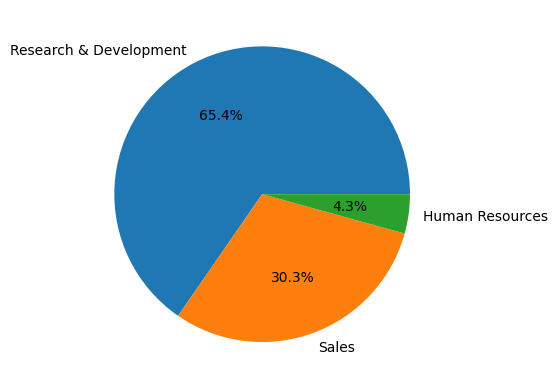

In [ ]:
byDept = df['Department'].value_counts()
byDept = byDept.to_frame().reset_index().rename(columns={'index': 'Department', 'Department': 'Count'})
plt.pie(byDept.Count,labels = byDept.Department,autopct='%1.1f%%')

<Axes: xlabel='Attrition', ylabel='count'>

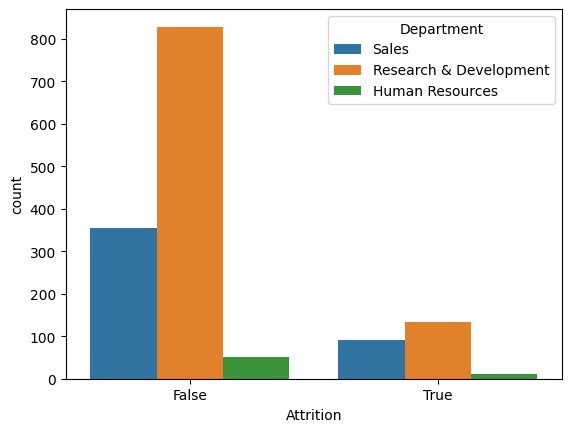

In [ ]:
sns.countplot(x= df['Attrition'],hue = df.Department)

In [ ]:
attrition_df = df[df['Attrition'] == True]
percentByDepartment = attrition_df['Department'].value_counts().reset_index().rename(columns={'index': 'Department', 'Department': 'percentage'})
percentByDepartment

,Department,percentage
0,Research & Development,133
1,Sales,92
2,Human Resources,12


In [ ]:
for index, row in percentByDepartment.iterrows():
    percentByDepartment.at[index, 'percentage'] = (row['percentage'] / byDept.at[index, 'Count']) * 100

percentByDepartment['percentage'] = percentByDepartment['percentage'].round(2)
percentByDepartment

,Department,percentage
0,Research & Development,13.84
1,Sales,20.63
2,Human Resources,19.05


<Axes: xlabel='Department', ylabel='count'>

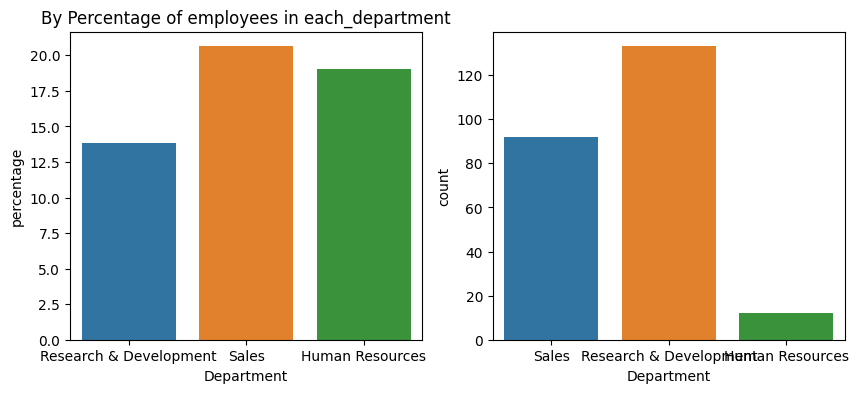

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(10,4))
sns.barplot(x =percentByDepartment['Department'],y = percentByDepartment['percentage'],ax = ax[0]).set_title('By Percentage of employees in each_department')
sns.countplot(x=attrition_df['Department'],ax = ax[1]).set_title('By Count of employees in each_department')

Text(0.5, 1.0, 'By age')

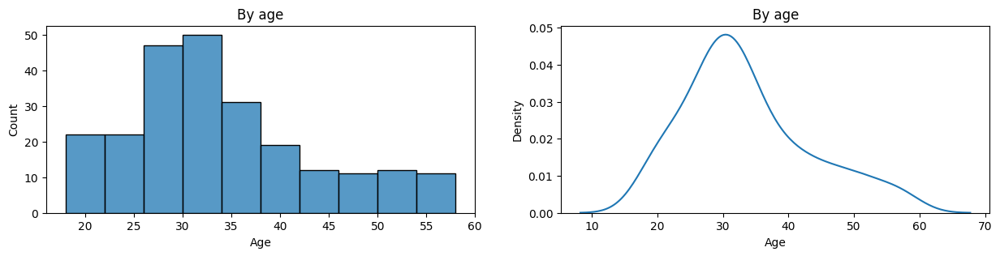

In [ ]:
fig, ax = plt.subplots(1,2,figsize = (15,3))

sns.histplot(x = attrition_df['Age'],bins = 10, ax = ax[0])
sns.kdeplot(attrition_df['Age'],ax = ax[1])

ax[0].set_title('By age')
ax[1].set_title('By age')

Text(0.5, 1.0, 'By age')

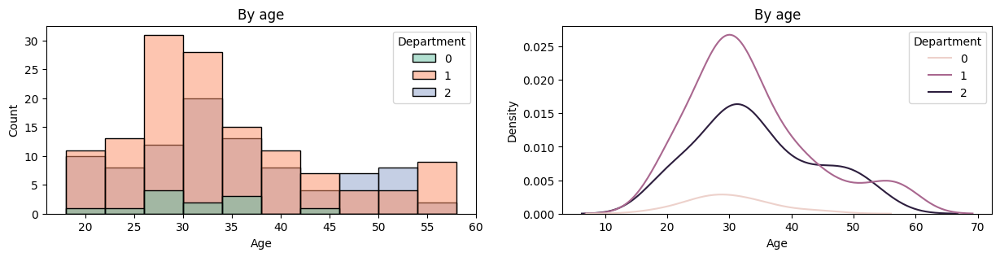

In [ ]:
fig, ax = plt.subplots(1,2,figsize = (15,3))

sns.histplot(x = attrition_df['Age'],hue = attrition_df['Department'],bins = 10, ax = ax[0],palette='Set2')
sns.kdeplot(x = attrition_df['Age'],hue = attrition_df['Department'],ax = ax[1])

ax[0].set_title('By age')
ax[1].set_title('By age')

In [ ]:
df.EducationField.unique()

array(['Life Sciences', 'Other', 'Medical', 'Marketing',
       'Technical Degree', 'Human Resources'], dtype=object)

In [ ]:
map_MaritalStatus = {'Single':0, 'Married':1, 'Divorced' : -1}
attrition_df['MaritalStatus'] = attrition_df['MaritalStatus'].map(map_MaritalStatus)
df['MaritalStatus'] = df['MaritalStatus'].map(map_MaritalStatus)

<ipython-input-19-893a15f8810e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  attrition_df['MaritalStatus'] = attrition_df['MaritalStatus'].map(map_MaritalStatus)


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

attrition_df['JobRole'] = label_encoder.fit_transform(attrition_df['JobRole'])
df['JobRole'] = label_encoder.fit_transform(df['JobRole'])

<ipython-input-114-f131ed5a8030>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  attrition_df['JobRole'] = label_encoder.fit_transform(attrition_df['JobRole'])


In [ ]:
attrition_df.rename(columns={'Gender': 'Male'}, inplace=True)
df.rename(columns={'Gender': 'Male'}, inplace=True)

<ipython-input-115-aedd6fa7dfa8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  attrition_df.rename(columns={'Gender': 'Male'}, inplace=True)


In [ ]:
mapMale = {'Male': True, 'Female':False}
attrition_df['Male'] = attrition_df['Male'].map(mapMale)
df['Male'] = df['Male'].map(mapMale)

<ipython-input-116-b1152bd8df18>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  attrition_df['Male'] = attrition_df['Male'].map(mapMale)


In [ ]:
attrition_df.EducationField.unique()

array(['Life Sciences', 'Other', 'Medical', 'Technical Degree',
       'Marketing', 'Human Resources'], dtype=object)

In [ ]:
attrition_df['EducationField'] = label_encoder.fit_transform(attrition_df['EducationField'])
df['EducationField'] = label_encoder.fit_transform(df['EducationField'])

<ipython-input-117-f5be5014cf95>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  attrition_df['EducationField'] = label_encoder.fit_transform(attrition_df['EducationField'])


In [ ]:
attrition_df['Department'] = label_encoder.fit_transform(attrition_df['Department'])
df['Department'] = label_encoder.fit_transform(df['Department'])

<ipython-input-118-a7697c828c2b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  attrition_df['Department'] = label_encoder.fit_transform(attrition_df['Department'])


In [ ]:
attrition_df['BusinessTravel'] = label_encoder.fit_transform(attrition_df['BusinessTravel'])
df['BusinessTravel'] = label_encoder.fit_transform(df['BusinessTravel'])


<ipython-input-119-067bd5f2e28f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  attrition_df['BusinessTravel'] = label_encoder.fit_transform(attrition_df['BusinessTravel'])


In [ ]:
plt.figure(figsize=(13,9))
sns.heatmap(attrition_df.corr(), annot=True, fmt='.1f', vmax=0.8, linewidth=0.1, cmap='coolwarm')
plt.show()

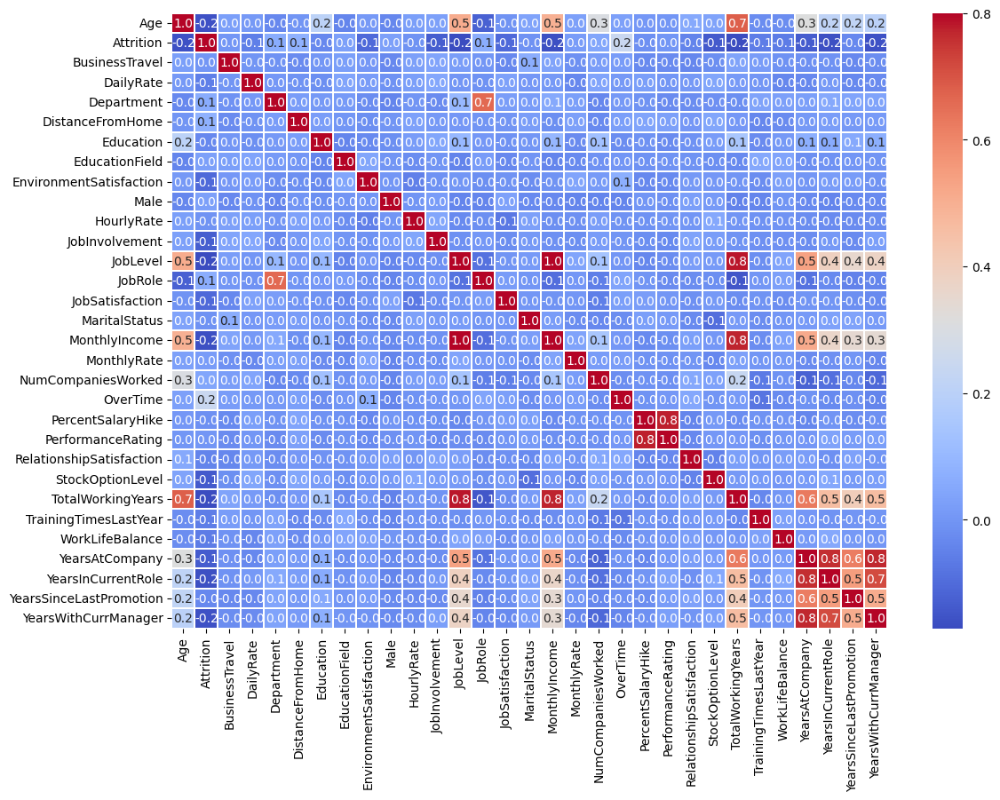

In [ ]:
plt.figure(figsize=(13,9))
sns.heatmap(df.corr(), annot=True, fmt='.1f', vmax=0.8, linewidth=0.1, cmap='coolwarm')
plt.show()

Age, JobLevel, MonthlyIncome, OverTime, Total Working years, Years in current role,YearsWithCurrManager

<ipython-input-141-ef9ec8ed81d0>:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = attrition_df.JobLevel,hue = attrition_df['YearsInCurrentRole'],ax = ax[2,1],palette = 'Set2')
<ipython-input-141-ef9ec8ed81d0>:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = attrition_df.JobLevel,hue = attrition_df['YearsInCurrentRole'],ax = ax[2,1],palette = 'Set2')


<Axes: xlabel='JobLevel', ylabel='Density'>

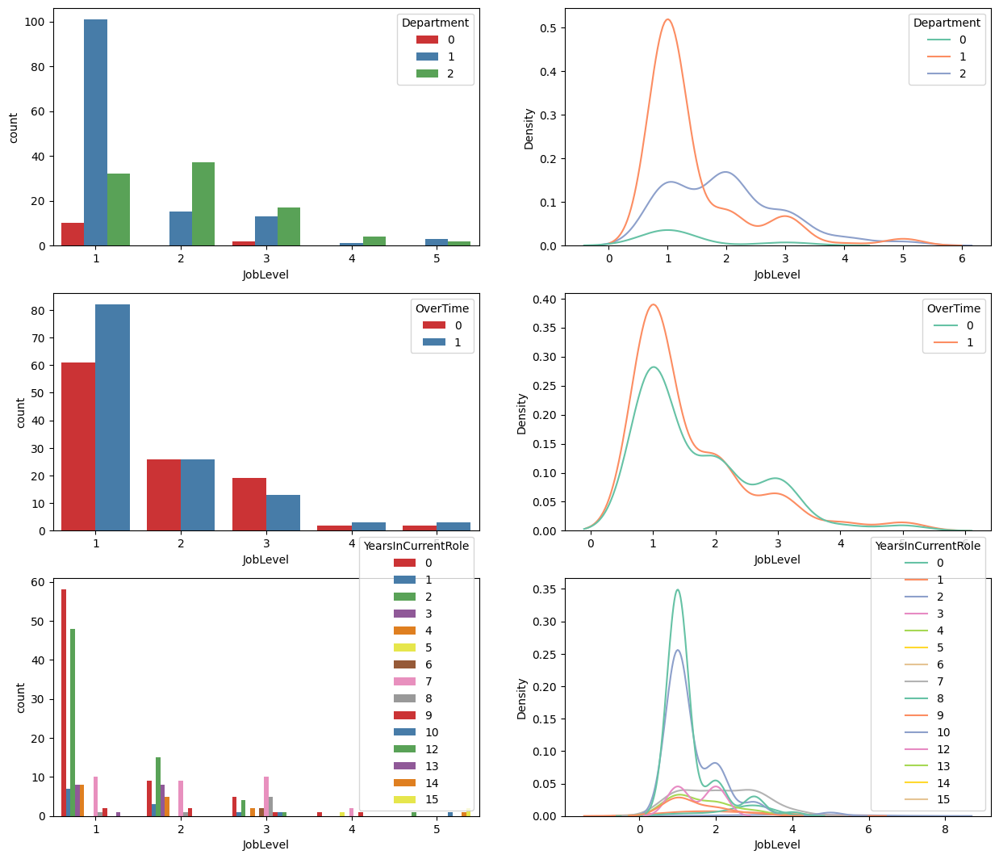

In [ ]:
# sns.kdeplot(attrition_df.JobLevel)
fig, ax = plt.subplots(3,2,figsize = (15,13))

sns.countplot(x = attrition_df.JobLevel,hue = attrition_df['Department'], ax = ax[0,0],palette = 'Set1' )
sns.kdeplot(x = attrition_df.JobLevel,hue = attrition_df['Department'],ax = ax[0,1],palette = 'Set2')
sns.countplot(x = attrition_df.JobLevel,hue = attrition_df['OverTime'], ax = ax[1,0],palette = 'Set1' )
sns.kdeplot(x = attrition_df.JobLevel,hue = attrition_df['OverTime'],ax = ax[1,1],palette = 'Set2')
sns.countplot(x = attrition_df.JobLevel,hue = attrition_df['YearsInCurrentRole'], ax = ax[2,0],palette = 'Set1' )
sns.kdeplot(x = attrition_df.JobLevel,hue = attrition_df['YearsInCurrentRole'],ax = ax[2,1],palette = 'Set2')



<ipython-input-161-10ace075d2dd>:7: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(x = attrition_df.Age,y = attrition_df['MonthlyIncome'], ax = ax[2,0],palette = 'Set1' )
<ipython-input-161-10ace075d2dd>:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(x = attrition_df.Age,y = attrition_df['JobLevel'],ax = ax[2,1],palette = 'Set2')


<Axes: xlabel='Age', ylabel='JobLevel'>

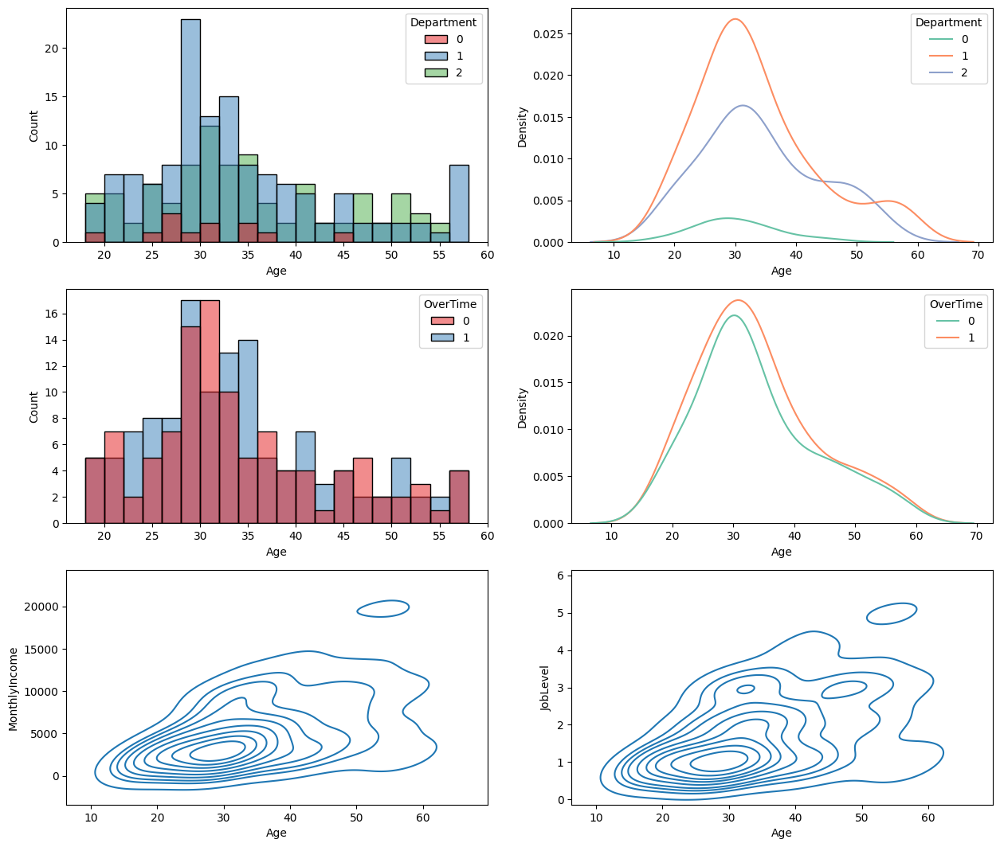

In [ ]:
fig, ax = plt.subplots(3,2,figsize = (15,13))

sns.histplot(x = attrition_df.Age,hue = attrition_df['Department'],bins = 20, ax = ax[0,0],palette = 'Set1' )
sns.kdeplot(x = attrition_df.Age,hue = attrition_df['Department'],ax = ax[0,1],palette = 'Set2')
sns.histplot(x = attrition_df.Age,hue = attrition_df['OverTime'],bins = 20, ax = ax[1,0],palette = 'Set1' )
sns.kdeplot(x = attrition_df.Age,hue = attrition_df['OverTime'],ax = ax[1,1],palette = 'Set2')
sns.kdeplot(x = attrition_df.Age,y = attrition_df['MonthlyIncome'], ax = ax[2,0],palette = 'Set1' )
sns.kdeplot(x = attrition_df.Age,y = attrition_df['JobLevel'],ax = ax[2,1],palette = 'Set2')

<Axes: xlabel='TotalWorkingYears', ylabel='YearsInCurrentRole'>

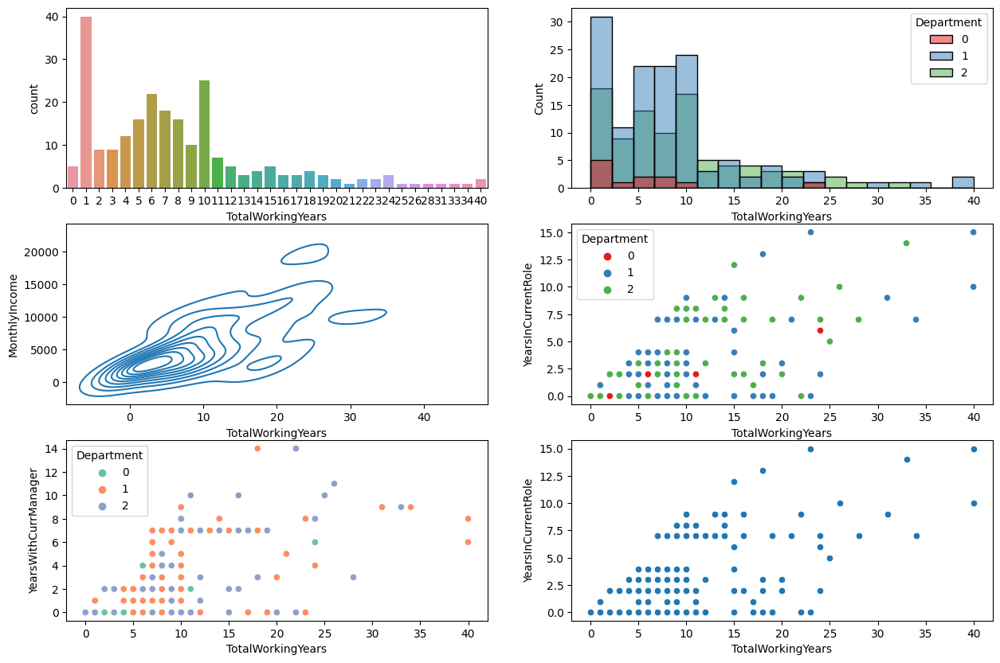

In [ ]:
fig, ax = plt.subplots(3,2,figsize=(15,10))
sns.countplot(x = attrition_df['TotalWorkingYears'],ax = ax[0,0])
sns.histplot(x = attrition_df['TotalWorkingYears'],hue=attrition_df['Department'],ax = ax[0,1],palette = 'Set1')
sns.kdeplot(x= attrition_df['TotalWorkingYears'],y= attrition_df['MonthlyIncome'],ax = ax[1,0])
sns.scatterplot(x= attrition_df['TotalWorkingYears'],y= attrition_df['YearsInCurrentRole'],hue = attrition_df['Department'],ax = ax[1,1],palette = 'Set1')
sns.scatterplot(x = attrition_df['TotalWorkingYears'], y = attrition_df['YearsWithCurrManager'],ax = ax[2,0],palette = 'Set2',hue = attrition_df['Department'])
sns.scatterplot(x = attrition_df['TotalWorkingYears'], y = attrition_df['YearsInCurrentRole'],ax = ax[2,1])